# Linear Regression

## Load Dataset from sklearn

In [1]:
!pip install matplotlib seaborn pandas sklearn

  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1321 sha256=929bb4b167d498d7efbf57bea04ae75f9de1c6b1db5506ca617ef33040a037b1
  Stored in directory: c:\users\lukaid\appdata\local\pip\cache\wheels\22\0b\40\fd3f795caaa1fb4c6cb738bc1f56100be1e57da95849bfc897
Successfully built sklearn


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
from sklearn.datasets import load_boston
boston = load_boston()

print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [4]:
df = pd.DataFrame(boston.data, columns=boston.feature_names)
df["TARGET"] = boston.target
df.tail()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,TARGET
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0
505,0.04741,0.0,11.93,0.0,0.573,6.030,80.8,2.5050,1.0,273.0,21.0,396.90,7.88,11.9


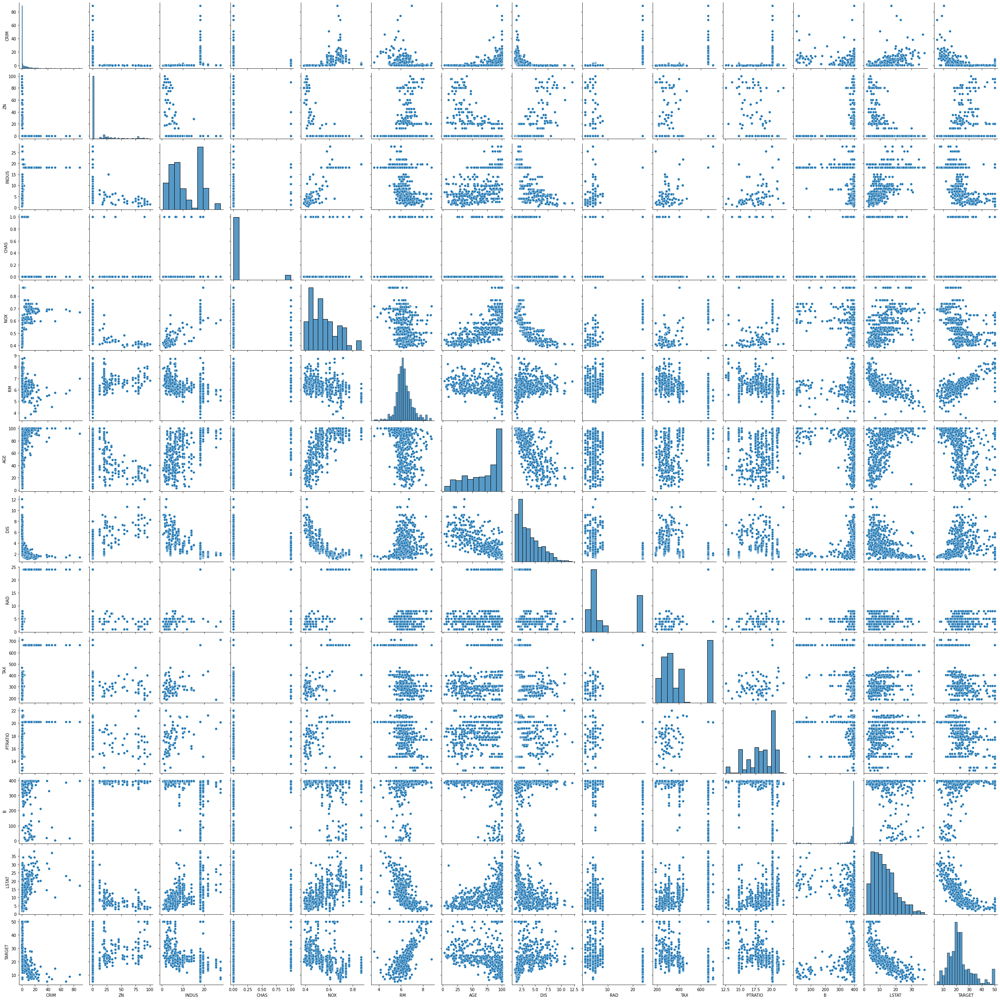

In [5]:
sns.pairplot(df)
plt.show()

In [6]:
cols = ["TARGET", "INDUS", "RM", "LSTAT", "NOX", "DIS"]

In [7]:
df[cols].describe()

,TARGET,INDUS,RM,LSTAT,NOX,DIS
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,22.532806,11.136779,6.284634,12.653063,0.554695,3.795043
std,9.197104,6.860353,0.702617,7.141062,0.115878,2.105710
min,5.000000,0.460000,3.561000,1.730000,0.385000,1.129600
25%,17.025000,5.190000,5.885500,6.950000,0.449000,2.100175
50%,21.200000,9.690000,6.208500,11.360000,0.538000,3.207450
75%,25.000000,18.100000,6.623500,16.955000,0.624000,5.188425
max,50.000000,27.740000,8.780000,37.970000,0.871000,12.126500


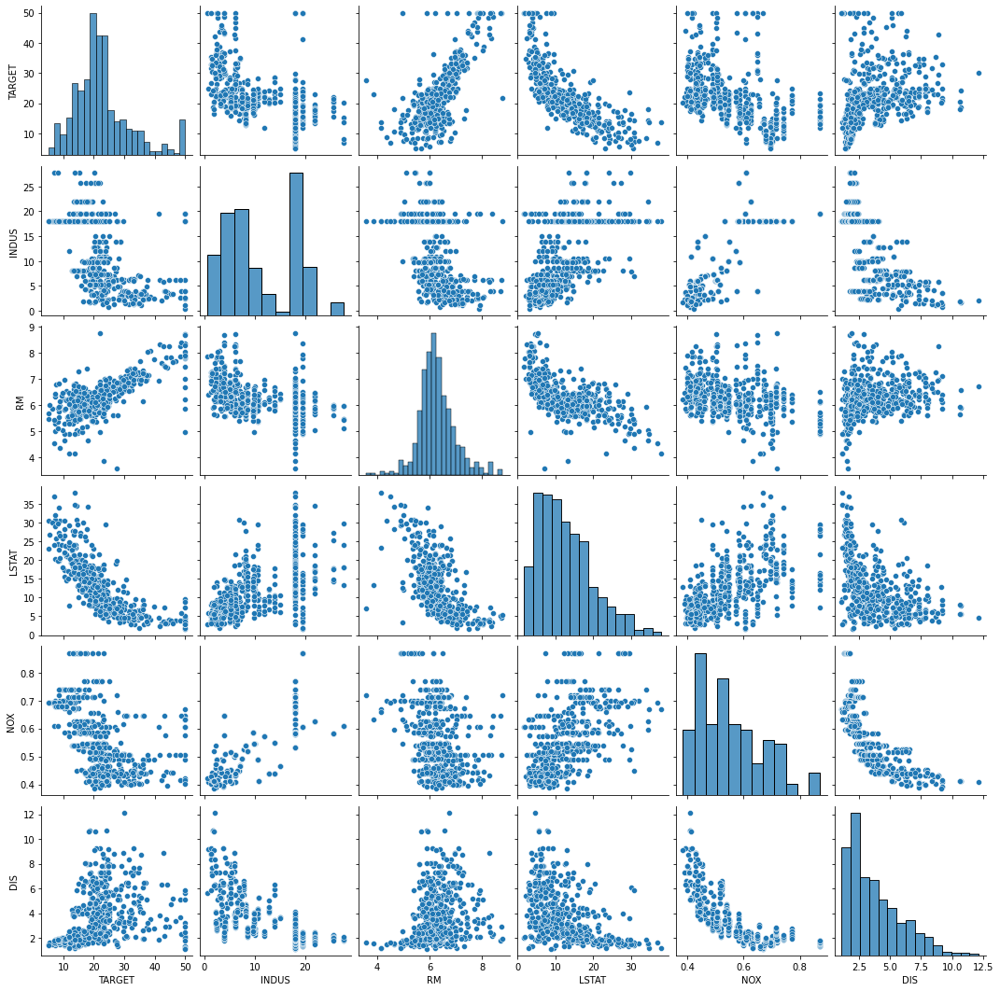

In [8]:
sns.pairplot(df[cols])
plt.show()

## Train Linear Model with PyTorch

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [10]:
# df[cols].values pandas의 dataframe을 numpy로 변환
data = torch.from_numpy(df[cols].values).float() # 그걸 다시 tensor로 변환

data.shape

torch.Size([506, 6])

In [11]:
# Split x and y.
y = data[:, :1] # target
x = data[:, 1:]

print(x.shape, y.shape)

torch.Size([506, 5]) torch.Size([506, 1])


In [19]:
# Define configurations.
n_epochs = 2000
learning_rate = 1e-3
print_interval = 100

In [20]:
# Define model.
# 리니어 모델을 설정
model = nn.Linear(x.size(-1), y.size(-1)) # [5, 1]

model

Linear(in_features=5, out_features=1, bias=True)

In [21]:
# Instead of implement gradient equation,
# we can use <optim class> to update model parameters, automatically.
# optim은 모델의 파라미터들을 러닝레이트로 그레디언트 디센트
optimizer = optim.SGD(model.parameters(),
                      lr=learning_rate)

In [22]:
# Whole training samples are used in 1 epoch.
# Thus, "N epochs" means that model saw a sample N-times.
for i in range(n_epochs):
    y_hat = model(x)
    loss = F.mse_loss(y_hat, y)
    
    optimizer.zero_grad() # 모델의 파라미터들의 그레디언트를 0으로 초기화
    loss.backward()
    
    optimizer.step() # 그레디언트 구했으니 파라미터 수정
    
    if (i + 1) % print_interval == 0:
        print('Epoch %d: loss=%.4e' % (i + 1, loss))

Epoch 100: loss=4.4816e+01
Epoch 200: loss=3.7823e+01
Epoch 300: loss=3.3953e+01
Epoch 400: loss=3.1772e+01
Epoch 500: loss=3.0542e+01
Epoch 600: loss=2.9849e+01
Epoch 700: loss=2.9458e+01
Epoch 800: loss=2.9237e+01
Epoch 900: loss=2.9113e+01
Epoch 1000: loss=2.9042e+01
Epoch 1100: loss=2.9002e+01
Epoch 1200: loss=2.8979e+01
Epoch 1300: loss=2.8966e+01
Epoch 1400: loss=2.8958e+01
Epoch 1500: loss=2.8954e+01
Epoch 1600: loss=2.8951e+01
Epoch 1700: loss=2.8949e+01
Epoch 1800: loss=2.8948e+01
Epoch 1900: loss=2.8946e+01
Epoch 2000: loss=2.8946e+01


## Let's see the result!

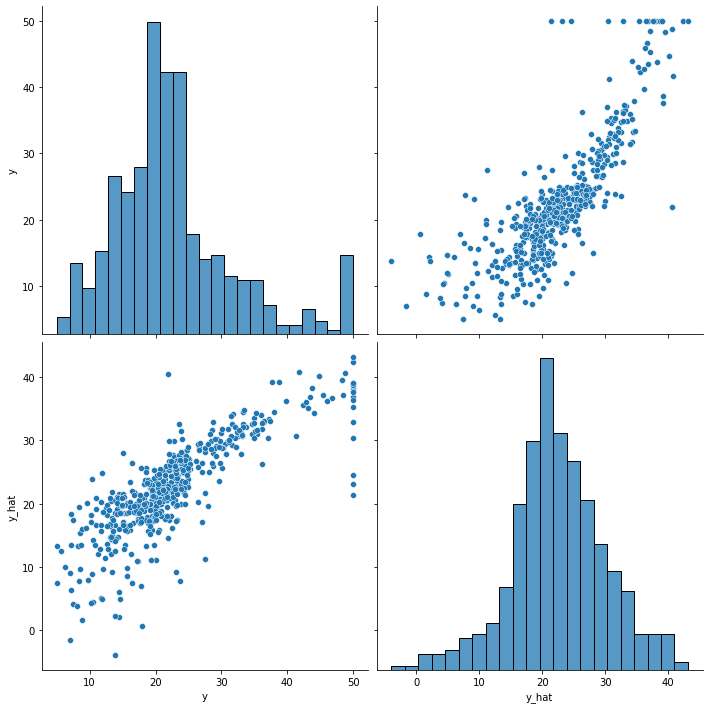

In [23]:
df = pd.DataFrame(torch.cat([y, y_hat], dim=1).detach_().numpy(),
                  columns=["y", "y_hat"])

sns.pairplot(df, height=5)
plt.show()